In [2]:
# !pip install opendatasets tensorflow_hub
# import opendatasets as od
# import tensorflow_hub as hub

import os
import datetime
import time

from matplotlib import pyplot as plt
from matplotlib import gridspec
import numpy as np

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model, Sequential, backend as K
from tensorflow.keras.layers import Conv2D, BatchNormalization, LeakyReLU, Conv2DTranspose, Dropout, ReLU, Input, Concatenate, concatenate
from tqdm import tqdm

from tensorflow.keras.applications.vgg16 import VGG16

gpus = tf.config.list_physical_devices('GPU')
print("GPU available: ", gpus)

GPU available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [4]:
# od.download("https://www.kaggle.com/ktaebum/anime-sketch-colorization-pair")
# !rm -r anime-sketch-colorization-pair/data/data
# !rm -r anime-sketch-colorization-pair/data/colorgram

In [5]:
def read_png(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    return img

In [6]:
def split_image(image):
    w = tf.shape(image)[1]
    w = w // 2
    colored_image = image[:, :w, :]
    sketch_image = image[:, w:, :]
    sketch_image = tf.image.resize(sketch_image, (256, 256))
    colored_image = tf.image.resize(colored_image, (256, 256))
    return sketch_image, colored_image

In [7]:
def flip_image(image):
    return tf.image.flip_left_right(image)

def random_jitter(sketch_image, colored_image):

    if tf.random.uniform(()) > 0.5:
        sketch_image = flip_image(sketch_image)
        colored_image = flip_image(colored_image)

    return sketch_image, colored_image

In [8]:
def normalize_symmetric(sketch_image, colored_image):
    sketch_image = tf.cast(sketch_image, tf.float32)/127.5 - 1
    colored_image = tf.cast(colored_image, tf.float32)/127.5 - 1
    return sketch_image, colored_image

def normalize_zero_to_one(sketch_image, colored_image):
    sketch_image = tf.cast(sketch_image, tf.float32)/255
    colored_image = tf.cast(colored_image, tf.float32)/255
    return sketch_image, colored_image

In [9]:
def image_loader(train=False, normalization_fn=normalize_zero_to_one):
    def load_image(image_path):
        image = read_png(image_path)
        sketch_image, colored_image = split_image(image)
        sketch_image, colored_image = normalization_fn(sketch_image, colored_image)
        
        if train:
            sketch_image, colored_image = random_jitter(sketch_image, colored_image)

        return sketch_image, colored_image

    return load_image

In [10]:
def show_n(images, titles=('',)):
    n = len(images)
    image_sizes = [image.shape[1] for image in images]
    w = (image_sizes[0] * 6) // 320
    plt.figure(figsize=(w * n, w))
    gs = gridspec.GridSpec(1, n, width_ratios=image_sizes)
    for i in range(n):
        plt.subplot(gs[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(images[i]), aspect='equal')
        plt.axis('off')
        plt.title(titles[i] if len(titles) > i else '')
    plt.show()

In [11]:
train_path = './anime-sketch-colorization-pair/data/train/'
train_images_path = [os.path.join(train_path, image_name) for image_name in os.listdir(train_path)]
print(f'Training samples = {len(train_images_path)}')

test_path = './anime-sketch-colorization-pair/data/val/'
test_images_path = [os.path.join(test_path, image_name) for image_name in os.listdir(test_path)]
print(f'Test samples = {len(test_images_path)}')

Training samples = 14224
Test samples = 3545


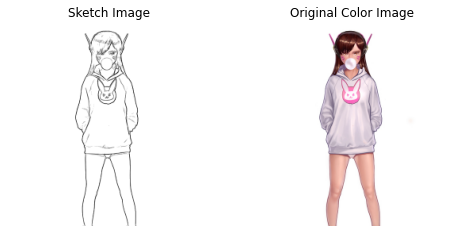

In [12]:
BATCH_SIZE = 32
BUFFER_SIZE = 400

train_dataset = tf.data.Dataset.from_tensor_slices(train_images_path)
train_dataset = train_dataset.map(image_loader(train=True, normalization_fn=normalize_symmetric), num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

for sketches, colors in train_dataset.take(1):
    show_n([sketches[0], colors[0]], titles=['Sketch Image', 'Original Color Image'])

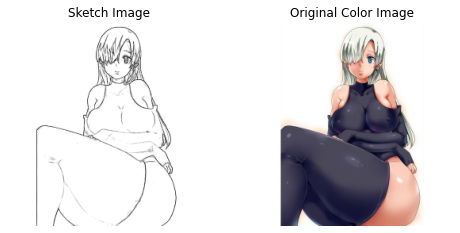

In [13]:
test_dataset = tf.data.Dataset.from_tensor_slices(test_images_path)
test_dataset = test_dataset.map(image_loader(train=False, normalization_fn=normalize_symmetric))
test_dataset = test_dataset.batch(BATCH_SIZE)

for sketches, colors in test_dataset.take(1):
    show_n([sketches[0], colors[0]], titles=['Sketch Image', 'Original Color Image'])

In [14]:
OUTPUT_CHANNELS = 3

In [15]:
def downsample(filters, size, apply_batchnorm=True):
    block = Sequential()
    block.add(Conv2D(filters, size, strides=2, padding='same', use_bias=False))

    if apply_batchnorm:
        block.add(BatchNormalization())
        
    block.add(LeakyReLU())

    return block

def upsample(filters, size, apply_dropout=False):
    block = Sequential()
    block.add(Conv2DTranspose(filters, size, strides=2, padding='same', use_bias=False))
    block.add(BatchNormalization())

    if apply_dropout:
        block.add(Dropout(0.5))

    block.add(ReLU())

    return block

In [16]:
def Generator():
    inp = Input(shape=[256,256,3])
    x = inp
    
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]
    
    bottleneck = downsample(512, 4)
    # decoder stack
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]

    last_layer = Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same', activation='tanh')
    
    # Downsampling
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    x = bottleneck(x)
    skips.reverse()

    # Upsampling + creating skip connections for the i-th encoder and (n-i)-th decoder
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last_layer(x)

    return Model(inputs=inp, outputs=x)

generator = Generator()

In [17]:
def Discriminator():
    inp = Input(shape=[256, 256, 3], name='sketch_image')
    target = Input(shape=[256, 256, 3], name='colored_image')

    x = concatenate([inp, target])
    
    block_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4)
    ]
    
    last_layer = Conv2D(1, 4, strides=1, padding='same')
    
    for block in block_stack:
        x = block(x)
    
    x = last_layer(x)

    return Model(inputs=[inp, target], outputs=x)

discriminator = Discriminator()

In [18]:
def pixel_loss(true, pred):
    '''
    parameter "true" is real color image, parameter "pred" is generated image,
    For each pixel of real color image and generated image it returns the average 
    of distance between them.
    '''
    return K.mean( K.abs( true - pred ) )


In [19]:
def feature_loss(true, pred):
    '''
    parameter "true" is feature map of real color image,
    parameter "pred" is feature map of generated image, 
    it returns the euclidean distance between feature map 
    of real color image and generated image.
    '''
    return K.mean( K.sqrt( K.sum( K.square( true - pred ))))

In [20]:
def variation_loss(pred):
    '''
    parameter "pred" is generated image, 
    it returns the square root of sum of differences between neighbouring pixels
    of geberated image
    '''
    return tf.sqrt(K.sum(K.square(pred[:, 1:, :, :] - pred[:, :-1, :, :]))\
                             + K.sum(K.square(pred [:, :, 1:, :] - pred [:, :, :-1, :])))

In [21]:
# Extracting intermediate layer features keras : https://keras.io/applications/#vgg16
vgg16 = VGG16(weights='imagenet', include_top=False)
vgg_1 = Model(inputs=vgg16.input, outputs=ReLU()(vgg16.get_layer('block2_conv2').output))
vgg_2 = Model(inputs=vgg16.input, outputs=ReLU()(vgg16.get_layer('block2_conv2').output))


loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
pixel_loss_weight = 100
variation_loss_weight = .0001
feature_loss_weight = .01

def generator_loss(disc_generated_output, gen_output, target):
    
    vgg1_out = vgg_1([tf.image.resize(target, (256,256), tf.image.ResizeMethod.BILINEAR)])
    vgg2_out = vgg_2([tf.image.resize(gen_output, (256,256), tf.image.ResizeMethod.BILINEAR)])
    
    traditional_loss_fns =  pixel_loss_weight * pixel_loss(target, gen_output) +\
               variation_loss_weight * variation_loss(gen_output) + feature_loss_weight * feature_loss(vgg1_out, vgg2_out)
    
    
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    
    total_gen_loss = gan_loss + traditional_loss_fns

    return total_gen_loss

58889256/58889256 [==============================] - 0s 0us/step


In [22]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    
    return real_loss, generated_loss, real_loss + generated_loss

In [23]:
generator_optimizer = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

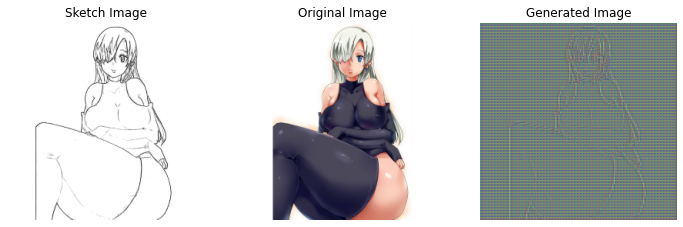

In [24]:
def generate_images(model, test_input, target):
    prediction = model(test_input, training=False)
    show_n([test_input[0], target[0], prediction[0]], titles=['Sketch Image', 'Original Image', 'Generated Image'])
    
for example_input, example_target in test_dataset.take(1):
      generate_images(generator, example_input, example_target)

In [25]:
checkpoint_dir = './training_checkpoints/color_painter/'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)
manager = tf.train.CheckpointManager(checkpoint, './tf_ckpts/color_painter/', max_to_keep=3)

In [26]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/color_painter/")

In [27]:
@tf.function
def train_step(sketch_image, ground_truth, epoch, step):
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generator_output = generator(sketch_image, training=True)

        disc_real_output = discriminator([sketch_image, ground_truth], training=True)
        disc_generated_output = discriminator([sketch_image, generator_output], training=True)

        gen_loss = generator_loss(disc_generated_output, generator_output, ground_truth)
        disc_real_loss, disc_generated_loss, disc_total_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_total_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    
    # if step % 2 == 0:
    if step % 3 == 0:
        discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))
    
    return gen_loss, disc_total_loss, disc_generated_loss

In [28]:
epoch_loss_avg_gen = tf.keras.metrics.Mean('g_loss')
epoch_loss_avg_disc = tf.keras.metrics.Mean('d_loss')
epoch_loss_avg_disc_confidence = tf.keras.metrics.Mean('d_confidence')


In [29]:
def fit(train_ds, test_ds, epochs):
    
    start = 0
    checkpoint.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("Restored from {}".format(manager.latest_checkpoint))
        start = int(manager.latest_checkpoint.split('-')[-1])
    else:
        print("Initializing from scratch.")
            
    for epoch in range(start + 1, start + epochs+1):
        
        for example_input, example_target in test_ds.take(1):
            generate_images(generator, example_input, example_target)
        
        print("Epoch: ", epoch)
        
        start = time.time()
        
        for n, (sketch_image, colored_image) in tqdm(train_ds.enumerate()):
            g_loss, d_loss, d_generated_loss = train_step(sketch_image, colored_image, epoch, n)
            epoch_loss_avg_gen(g_loss)
            epoch_loss_avg_disc(d_loss)
            epoch_loss_avg_disc_confidence(1-d_generated_loss)
            
        print()
        print("Generator Loss: %.2f" % epoch_loss_avg_gen.result().numpy())
        print("Discriminator Loss: %.2f" % epoch_loss_avg_disc.result().numpy())
        print("Discriminator Confidence: %.2f" % epoch_loss_avg_disc_confidence.result().numpy())
        print()
        print(f'Time taken: {time.time()-start:.2f} sec')
        print("=====================================================")

        start = time.time()
        
        with summary_writer.as_default():
            tf.summary.scalar('gen_loss', epoch_loss_avg_gen.result().numpy(), step=epoch)
            tf.summary.scalar('disc_loss', epoch_loss_avg_disc.result().numpy(), step=epoch)
            tf.summary.scalar('disc_confidence', epoch_loss_avg_disc_confidence.result().numpy(), step=epoch)
            
        
        epoch_loss_avg_gen.reset_states()
        epoch_loss_avg_disc.reset_states()
        epoch_loss_avg_disc_confidence.reset_states()
        
        
        saved_path = manager.save()
        print("Saved checkpoint for epoch {}: {}".format(int(epoch), saved_path))
        
        
        generator.save_weights(f'./generator_weights/color_painter/epoch-{epoch}')

In [30]:
# %reload_ext tensorboard
# %tensorboard --logdir logs

# !kill 250

In [31]:
# fit(train_dataset, test_dataset, epochs=0)

In [32]:
# # !rm -r training_checkpoints/color_painter

# !rm -r logs/fit/color_painter
# !rm -r tf_ckpts/color_painter
# !rm -r generator_weights/color_painter

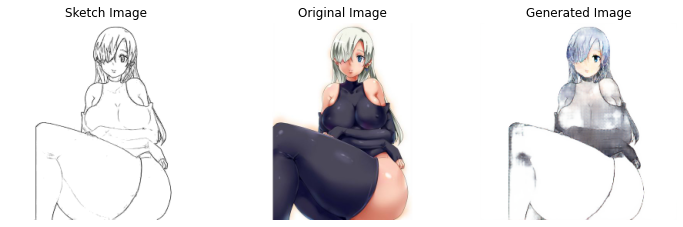

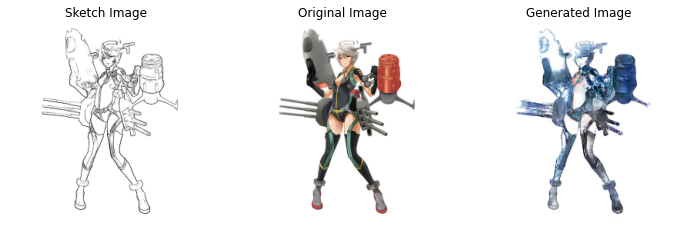

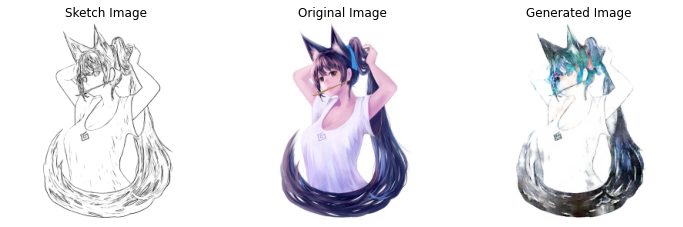

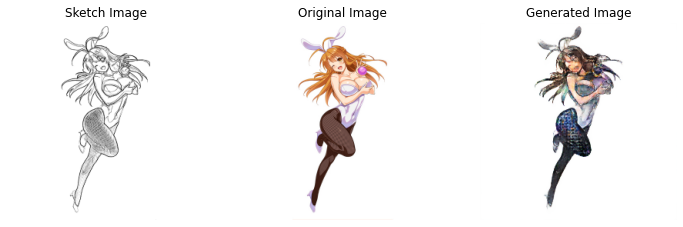

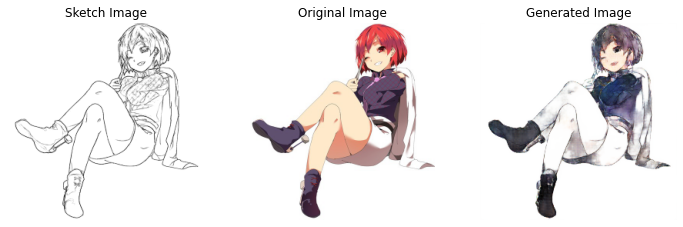

...

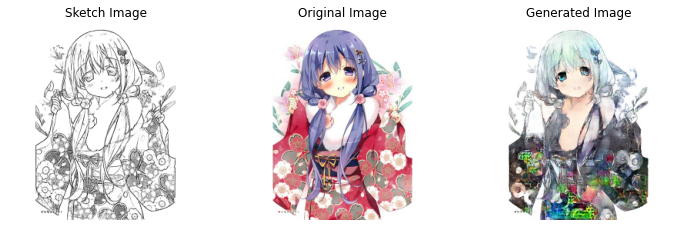

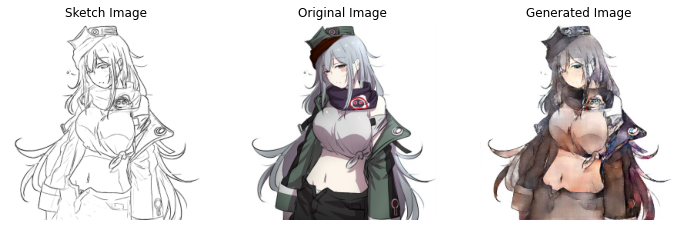

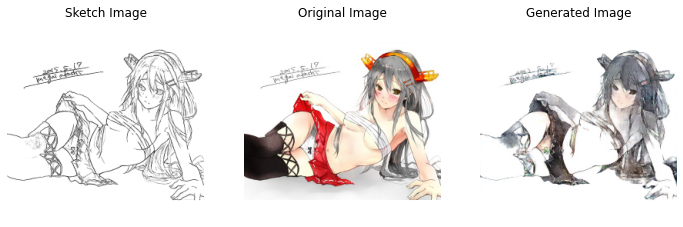

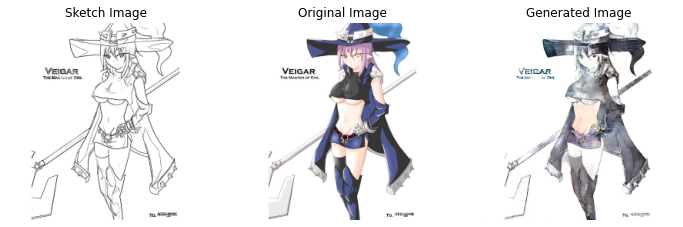

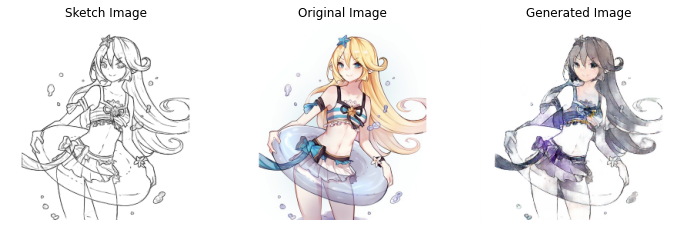

In [33]:
generator.load_weights('generator_weights/color_painter/epoch-57')

for example_inputs, example_targets in test_dataset.take(3):
    for i in range(len(example_inputs)):
        generate_images(generator, example_inputs[i:i+1], example_targets[i:i+1])

In [34]:
mae = 0
for i, (sketches, colors) in tqdm(test_dataset.enumerate()):
    generated = generator.predict(sketches, verbose=0)
    loss = tf.reduce_mean(tf.abs(colors - generated))
    mae += loss
print(f'avg mae = {mae / len(test_dataset)}')

100%|██████████| 111/111 [00:29<00:00,  3.70it/s]

avg mae = 0.16364352405071259


avg mae = 0.16364352405071259

In [35]:
ssim = 0
for i, (sketches, colors) in tqdm(test_dataset.enumerate(29)):
    generated = generator.predict(sketches, verbose=0)
    loss = tf.reduce_mean(tf.image.ssim(generated, colors, 255))
    ssim += loss
print(f'avg ssim = {ssim / len(test_dataset)}')

100%|██████████| 111/111 [00:27<00:00,  4.05it/s]

avg ssim = 0.9845559597015381


avg ssim = 0.9845559597015381